In [1]:
import contextlib2
import io
import IPython
import json
import numpy as np
import os
import pathlib
import pandas as pd
import sys
import tensorflow as tf
import time

from PIL import Image, ImageDraw


from tensorflow import keras

In [2]:
model_path='/content/drive/MyDrive/deep learning/Object_detection/results/exported_models/export/saved_model'

In [3]:
detect_fn_tf_odt = tf.saved_model.load(model_path)

In [4]:
detect_fn_tf_odt 

<tensorflow.python.saved_model.load.Loader._recreate_base_user_object.<locals>._UserObject at 0x7fcd84d9b450>

In [5]:
def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
    path: a file path (this can be local or on colossus)

    Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
    """
    img_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(io.BytesIO(img_data))
    (im_width, im_height) = image.size
    
    return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

def detect(image_np):
    """Detect COTS from a given numpy image."""

    input_tensor = np.expand_dims(image_np, 0)
    start_time = time.time()
    detections = detect_fn_tf_odt(input_tensor)
    return detections

In [6]:
DETECTION_THRESHOLD = 0.2

In [7]:


def IOU_coco(bbox1, bbox2):
    '''
        adapted from https://stackoverflow.com/questions/25349178/calculating-percentage-of-bounding-box-overlap-for-image-detector-evaluation
    '''
    x_left = max(bbox1[0], bbox2[0])
    y_top = max(bbox1[1], bbox2[1])
    x_right = min(bbox1[0] + bbox1[2], bbox2[0] + bbox2[2])
    y_bottom = min(bbox1[1] + bbox1[3], bbox2[1] + bbox2[3])
    if x_right < x_left or y_bottom < y_top:
        return 0.0
    intersection_area = (x_right - x_left) * (y_bottom - y_top)
    bb1_area = bbox1[2] * bbox1[3]
    bb2_area = bbox2[2] * bbox2[3]
    iou = intersection_area / float(bb1_area + bb2_area - intersection_area)

    assert iou >= 0.0
    assert iou <= 1.0
    return iou



In [8]:
!unzip "/content/drive/MyDrive/deep learning/Object_detection/Coral_Reef/data/tensorflow-great-barrier-reef.zip"  -d "/content/images"

Streaming output truncated to the last 5000 lines.
  inflating: /content/images/train_images/video_2/4303.jpg  
  inflating: /content/images/train_images/video_2/4304.jpg  
  inflating: /content/images/train_images/video_2/4305.jpg  
  inflating: /content/images/train_images/video_2/4306.jpg  
  inflating: /content/images/train_images/video_2/4307.jpg  
  inflating: /content/images/train_images/video_2/4308.jpg  
  inflating: /content/images/train_images/video_2/4309.jpg  
  inflating: /content/images/train_images/video_2/431.jpg  
  inflating: /content/images/train_images/video_2/4310.jpg  
  inflating: /content/images/train_images/video_2/4311.jpg  
  inflating: /content/images/train_images/video_2/4312.jpg  
  inflating: /content/images/train_images/video_2/4313.jpg  
  inflating: /content/images/train_images/video_2/4314.jpg  
  inflating: /content/images/train_images/video_2/4315.jpg  
  inflating: /content/images/train_images/video_2/4316.jpg  
  inflating: /content/images/train_

In [9]:
import cv2

In [10]:
import pandas as pd

In [11]:
df=pd.read_csv('/content/images/train.csv')
df = df[df.annotations!='[]']
df = df.reset_index(drop=True)

# Creating functions to inspect images

In [12]:
def create_path(video_id,
                video_frame,
                path_to_data='/content/images/'):
  return path_to_data+'train_images'+f"/video_{video_id}"+f"/{video_frame}.jpg"

In [13]:
DETECTION_THRESHOLD=0.2

In [18]:
def plot_predictions(i,path_to_data='/content/images/', height=720,width=1280):
  image_path=create_path(df.iloc[i,0],df.iloc[i,2],path_to_data)
  v=load_image_into_numpy_array(image_path)
  detections=detect(v)

  img = cv2.imread(image_path)
  out_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  num_detections = detections['num_detections'][0].numpy().astype(np.int32)


  for index in range(num_detections):
    score = detections['detection_scores'][0][index].numpy()
    if score < DETECTION_THRESHOLD:
      continue
    
    bbox = detections['detection_boxes'][0][index].numpy()
    y_min = int(bbox[0]*height)
    x_min = int(bbox[1]*width)
    y_max = int(bbox[2]*height)
    x_max = int(bbox[3]*width)
        
    bbox_width = x_max - x_min
    bbox_height = y_max - y_min
    
    cv2.rectangle(out_image,(x_min, y_max), (x_max, y_min), 1, 2)
    print(score)
  box_dict=df.iloc[i,5]
  box_dict=json.loads(box_dict.replace("'", '"'))
  for x in box_dict:
    x_min=x['x']
    y_min=x['y']
    x_max=x_min+x['width']
    y_max=y_min+x['height']

    cv2.rectangle(out_image,(x_min, y_max), (x_max, y_min), 221, 2)
  
  display(Image.fromarray(out_image))


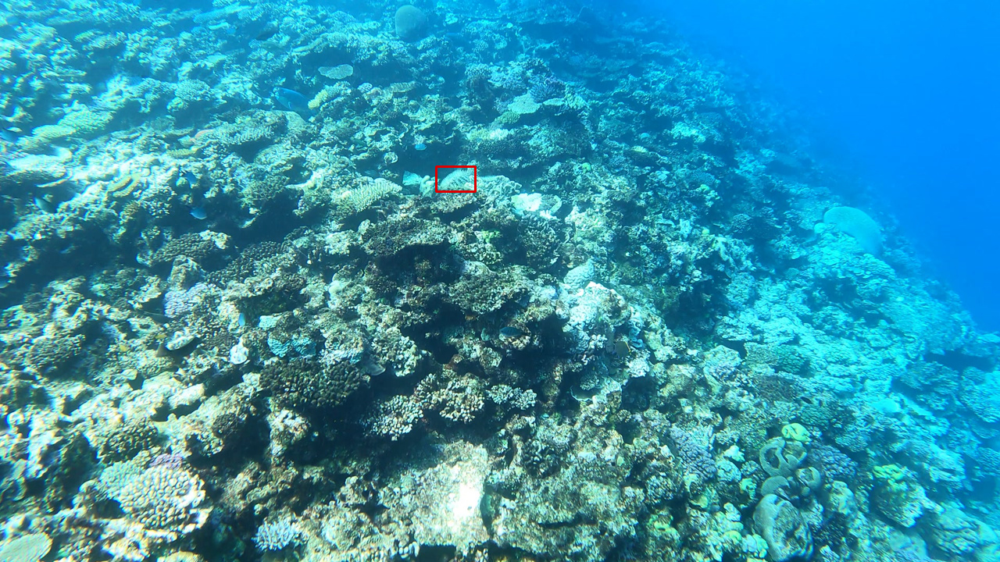

In [28]:
plot_predictions(1)

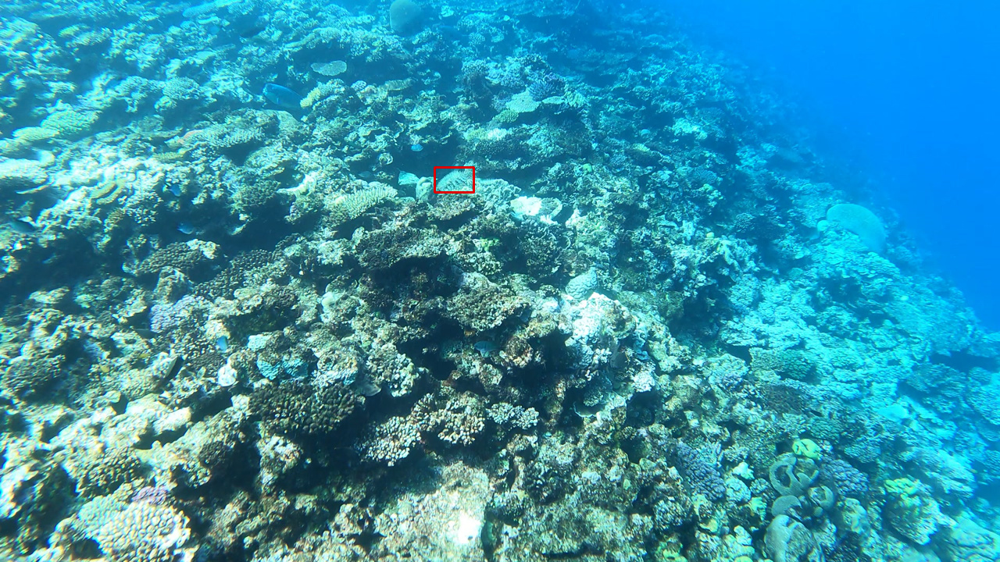

In [27]:
plot_predictions(3)

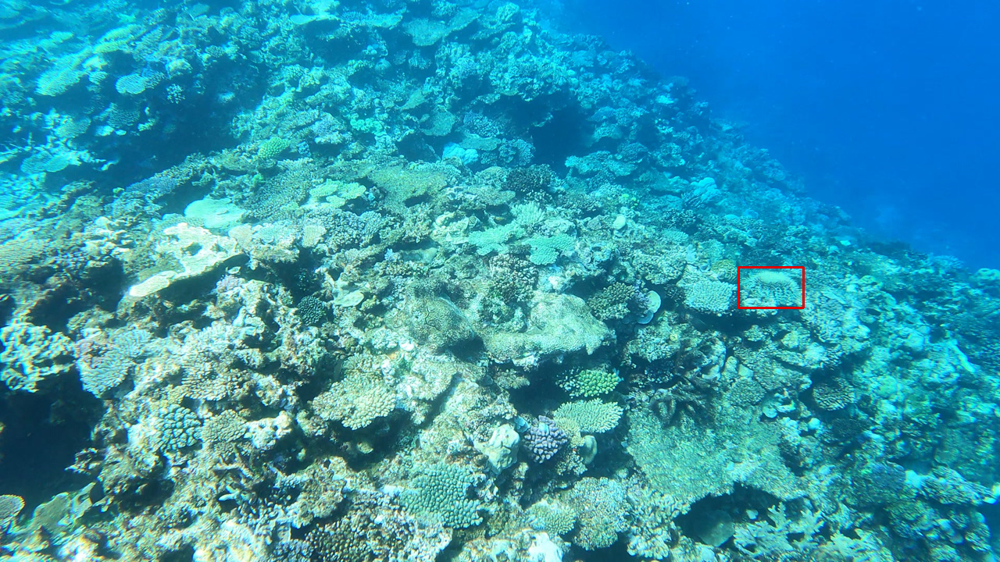

In [33]:
plot_predictions(352)

0.43552533
0.3626374
0.33247653
0.24132493


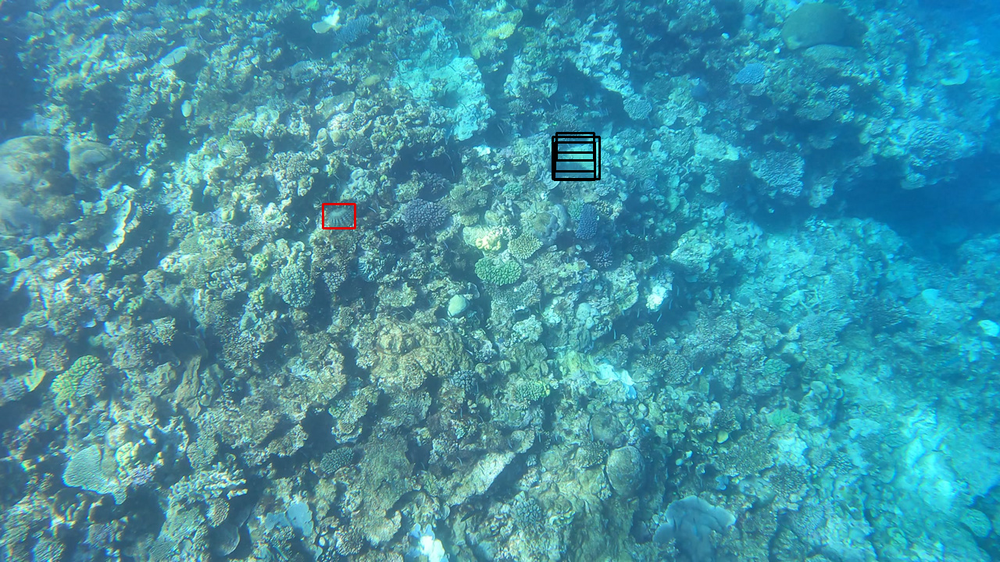

In [30]:
plot_predictions(442)

0.20267272


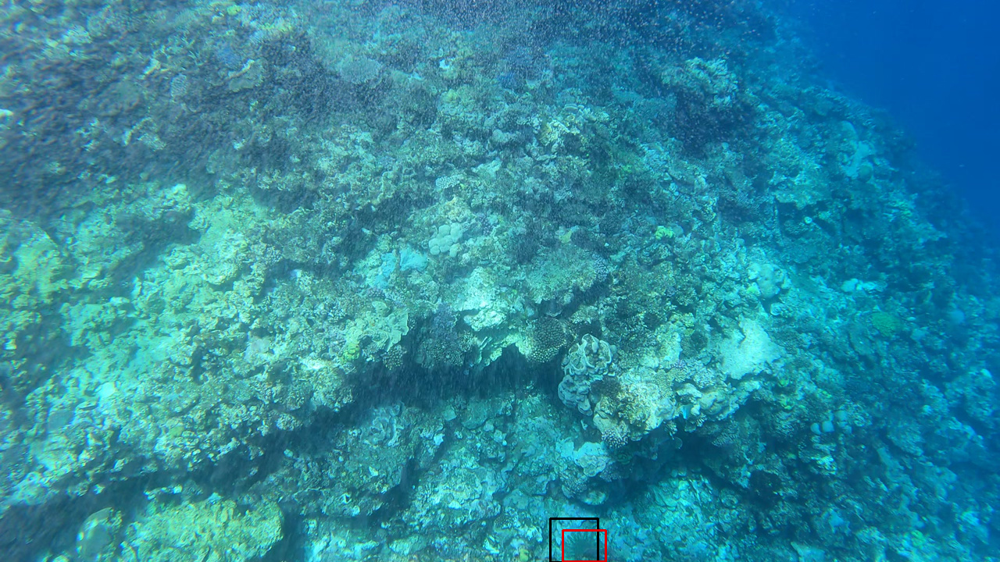

In [24]:
plot_predictions(285)

0.4111459
0.27452996
0.20545696


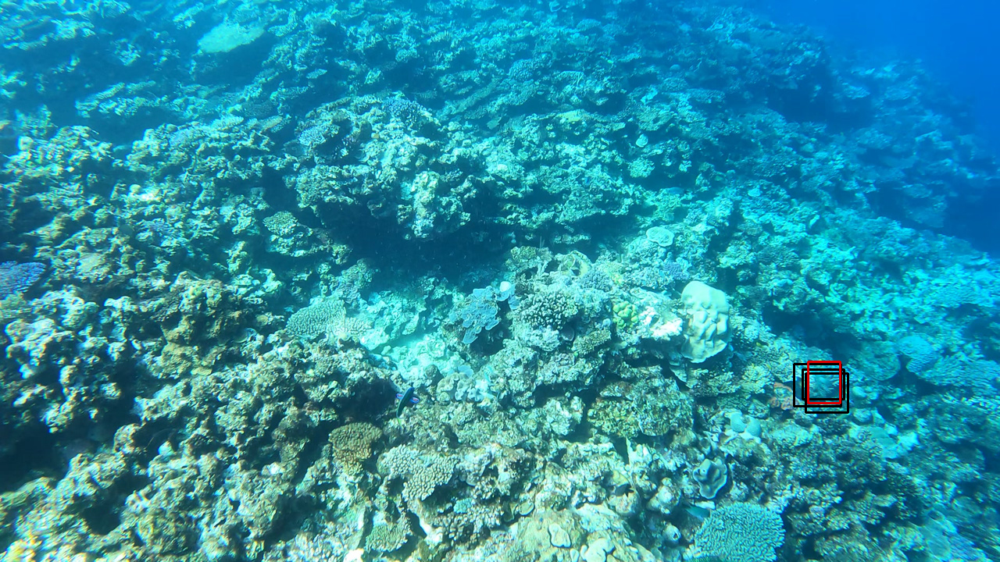

In [23]:
plot_predictions(273)

0.260211
0.2423346


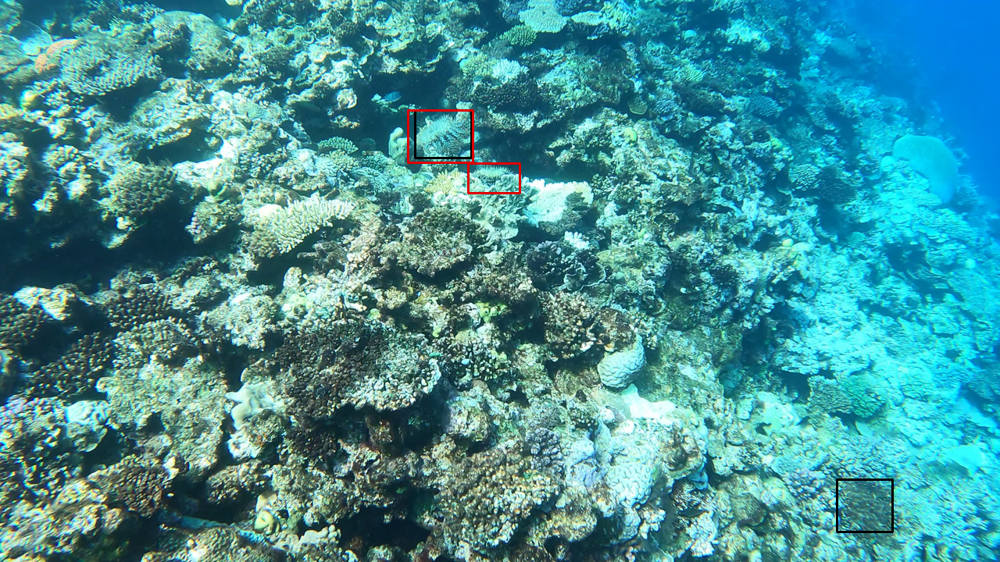

In [31]:
plot_predictions(22)